In [1]:
import pandas as pd
import numpy as np
import cv2
import os
import re
# import pydicom
import warnings

from PIL import Image
import cv2

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from albumentations.core.transforms_interface import ImageOnlyTransform

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

from matplotlib import pyplot as plt
import random
paddingSize= 0

warnings.filterwarnings("ignore")

In [2]:
# unzip model

import zipfile
import os

zip_file_path = '/kaggle/input/faster-resnet-p12/_output_.zip'
extract_to = '/kaggle/working/'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

In [8]:
# Load Model
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = torch.load('/kaggle/working/resnet_bm_p12.pth')#,map_location=torch.device('cpu'))
# model.to(device)
model.eval()
cpu_device = torch.device("cpu")

In [ ]:
def voc_ap(rec, prec, use_07_metric=True):
    """ ap = voc_ap(rec, prec, [use_07_metric])
    Compute VOC AP given precision and recall.
    If use_07_metric is true, uses the
    VOC 07 11 point method (default:True).
    """
    if use_07_metric:
        # 11 point metric
        ap = 0.
        for t in np.arange(0., 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.
    else:
        # correct AP calculation
        # first append sentinel values at the end
        mrec = np.concatenate(([0.], rec, [1.]))
        mpre = np.concatenate(([0.], prec, [0.]))

        # compute the precision envelope
        for i in range(mpre.size - 1, 0, -1):
            mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

        # to calculate area under PR curve, look for points
        # where X axis (recall) changes value
        i = np.where(mrec[1:] != mrec[:-1])[0]

        # and sum (\Delta recall) * prec
        ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap


57


  0%|          | 0/57 [00:00<?, ?it/s]

3
Number : 1
Time taken to per image the model :00:00:01.99
label: [1 1 1 1] -  score: [0.983364   0.64553744 0.18252721 0.05771996]


  2%|▏         | 1/57 [00:02<02:38,  2.84s/it]

3
Number : 2
Time taken to per image the model :00:00:00.15
label: [1 1 1 1 1 1 1 1 1 1 1 1 1 1] -  score: [0.97959715 0.96004736 0.88895965 0.8261966  0.6123413  0.60526294
 0.33236566 0.1717757  0.17107667 0.13681185 0.13250576 0.07950254
 0.06829056 0.05846945]


  4%|▎         | 2/57 [00:03<01:24,  1.54s/it]

3
Number : 3
Time taken to per image the model :00:00:00.17
label: [1 1] -  score: [0.98943526 0.8104743 ]


  5%|▌         | 3/57 [00:04<01:15,  1.39s/it]

3
Number : 4
Time taken to per image the model :00:00:00.13
label: [1 1 1 1 1 1 1 1 1 1 1 1 1] -  score: [0.9834293  0.968574   0.836684   0.70106286 0.5707558  0.50961524
 0.5091747  0.50082797 0.48942077 0.18013012 0.149903   0.07893392
 0.05600342]


  7%|▋         | 4/57 [00:05<00:54,  1.03s/it]

3
Number : 5
Time taken to per image the model :00:00:00.10
label: [1 1 1 1] -  score: [0.99028    0.75831854 0.22144967 0.07412201]


  9%|▉         | 5/57 [00:06<00:52,  1.00s/it]

3
Number : 6
Time taken to per image the model :00:00:00.11
label: [1 1 1] -  score: [0.99529946 0.8029359  0.11699764]


 11%|█         | 6/57 [00:06<00:42,  1.19it/s]

3
Number : 7
Time taken to per image the model :00:00:00.10
label: [1 1 1] -  score: [0.9642499  0.6494608  0.09103105]


 12%|█▏        | 7/57 [00:07<00:37,  1.32it/s]

3
Number : 8
Time taken to per image the model :00:00:00.11
label: [1 1 1 1] -  score: [0.9727701  0.8304097  0.07658234 0.06267485]


 14%|█▍        | 8/57 [00:08<00:38,  1.27it/s]

3
Number : 9
Time taken to per image the model :00:00:00.10
label: [1 1] -  score: [0.99826294 0.99398357]


 16%|█▌        | 9/57 [00:08<00:38,  1.26it/s]

3
Number : 10
Time taken to per image the model :00:00:00.10
label: [1 1] -  score: [0.9985214 0.9972211]


 18%|█▊        | 10/57 [00:09<00:33,  1.39it/s]

3
Number : 11
Time taken to per image the model :00:00:00.09
label: [1 1] -  score: [0.9724653 0.9691307]


 19%|█▉        | 11/57 [00:09<00:29,  1.58it/s]

3
Number : 12
Time taken to per image the model :00:00:00.13
label: [1] -  score: [0.9995759]


 21%|██        | 12/57 [00:10<00:32,  1.37it/s]

3
Number : 13
Time taken to per image the model :00:00:00.11
label: [1] -  score: [0.9988527]


 23%|██▎       | 13/57 [00:11<00:29,  1.47it/s]

3
Number : 14
Time taken to per image the model :00:00:00.08
label: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] -  score: [0.92356676 0.91241574 0.66716164 0.63331354 0.564658   0.56196666
 0.56075615 0.48387656 0.37158802 0.35168967 0.2731009  0.22146314
 0.16414699 0.1458243  0.12678318 0.0957355  0.09201067 0.08736858
 0.08479904 0.07170647 0.06031436 0.05115152]


 25%|██▍       | 14/57 [00:11<00:25,  1.67it/s]

3
Number : 15
Time taken to per image the model :00:00:00.10
label: [1 1] -  score: [0.9938069  0.80931664]


 26%|██▋       | 15/57 [00:12<00:24,  1.74it/s]

3
Number : 16
Time taken to per image the model :00:00:00.11
label: [1 1 1 1] -  score: [0.9830403  0.32517934 0.27444836 0.26657143]


 28%|██▊       | 16/57 [00:13<00:28,  1.43it/s]

3
Number : 17
Time taken to per image the model :00:00:00.10
label: [1 1] -  score: [0.9890382  0.06128575]


 30%|██▉       | 17/57 [00:14<00:29,  1.37it/s]

3
Number : 18
Time taken to per image the model :00:00:00.15
label: [1 1 1 1 1] -  score: [0.9529211  0.6745975  0.1523303  0.106516   0.08883047]


 32%|███▏      | 18/57 [00:14<00:27,  1.44it/s]

3
Number : 19
Time taken to per image the model :00:00:00.12
label: [1 1 1 1 1 1 1 1 1] -  score: [0.98277414 0.9100896  0.5569445  0.45029065 0.3629447  0.10491978
 0.10228846 0.07207188 0.06615589]


 33%|███▎      | 19/57 [00:15<00:24,  1.54it/s]

3
Number : 20
Time taken to per image the model :00:00:00.12
label: [1 1 1] -  score: [0.9951292  0.22540118 0.0736623 ]


 35%|███▌      | 20/57 [00:15<00:22,  1.61it/s]

3
Number : 21
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1] -  score: [0.99732614 0.605265   0.3370631  0.2845459  0.15486544]


 37%|███▋      | 21/57 [00:16<00:25,  1.43it/s]

3
Number : 22
Time taken to per image the model :00:00:00.10
label: [1 1 1 1 1 1] -  score: [0.9729595  0.41821858 0.40141106 0.2682884  0.08672687 0.08573232]


 39%|███▊      | 22/57 [00:17<00:22,  1.56it/s]

3
Number : 23
Time taken to per image the model :00:00:00.10
label: [1 1 1 1 1 1 1] -  score: [0.97878647 0.727464   0.36544546 0.210941   0.11454883 0.100135
 0.09371886]


 40%|████      | 23/57 [00:17<00:22,  1.52it/s]

3
Number : 24
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1 1 1 1] -  score: [0.9973068  0.7404871  0.35191813 0.2593774  0.2017184  0.12667276
 0.09363597 0.0566626 ]


 42%|████▏     | 24/57 [00:18<00:20,  1.60it/s]

3
Number : 25
Time taken to per image the model :00:00:00.07
label: [1 1 1] -  score: [0.9380369  0.8100831  0.42898276]


 44%|████▍     | 25/57 [00:19<00:23,  1.35it/s]

3
Number : 26
Time taken to per image the model :00:00:00.13
label: [1 1 1 1 1 1 1] -  score: [0.990337   0.9455117  0.57756484 0.47252515 0.34314793 0.07821822
 0.0701189 ]


 46%|████▌     | 26/57 [00:20<00:23,  1.30it/s]

3
Number : 27
Time taken to per image the model :00:00:00.10
label: [1 1 1 1 1] -  score: [0.98993987 0.9540789  0.36395755 0.24704531 0.05996522]


 47%|████▋     | 27/57 [00:20<00:21,  1.41it/s]

3
Number : 28
Time taken to per image the model :00:00:00.11
label: [1 1 1] -  score: [0.99360126 0.9817116  0.9529572 ]


 49%|████▉     | 28/57 [00:21<00:18,  1.54it/s]

3
Number : 29
Time taken to per image the model :00:00:00.07
label: [1 1 1 1 1] -  score: [0.9490039  0.12121068 0.06578947 0.05913204 0.0575086 ]


 51%|█████     | 29/57 [00:22<00:19,  1.44it/s]

3
Number : 30
Time taken to per image the model :00:00:00.11
label: [1 1] -  score: [0.9958112 0.056029 ]


 53%|█████▎    | 30/57 [00:23<00:19,  1.37it/s]

3
Number : 31
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1 1 1 1] -  score: [0.99604934 0.9787579  0.9659572  0.965448   0.9653868  0.30837634
 0.079691   0.0753362 ]


 54%|█████▍    | 31/57 [00:24<00:21,  1.21it/s]

3
Number : 32
Time taken to per image the model :00:00:00.12
label: [1] -  score: [0.99467283]


 56%|█████▌    | 32/57 [00:24<00:18,  1.36it/s]

3
Number : 33
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1 1] -  score: [0.92088866 0.5595074  0.296038   0.19412754 0.10595582 0.09556105]


 58%|█████▊    | 33/57 [00:25<00:15,  1.51it/s]

3
Number : 34
Time taken to per image the model :00:00:00.10
label: [1] -  score: [0.9686584]


 60%|█████▉    | 34/57 [00:25<00:13,  1.67it/s]

3
Number : 35
Time taken to per image the model :00:00:00.10
label: [1 1 1 1] -  score: [0.9912203  0.9372274  0.15905319 0.08769266]


 61%|██████▏   | 35/57 [00:26<00:12,  1.70it/s]

3
Number : 36
Time taken to per image the model :00:00:00.10
label: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] -  score: [0.9960473  0.95262015 0.93741256 0.93387765 0.8905049  0.88922405
 0.8751274  0.8304832  0.8111442  0.7979574  0.5602001  0.52412456
 0.5182203  0.48387092 0.45999876 0.35435563 0.23636334 0.20795076
 0.15678573 0.15293348 0.11348718 0.09443527 0.07950544 0.05504811
 0.05109547]


 63%|██████▎   | 36/57 [00:27<00:14,  1.42it/s]

3
Number : 37
Time taken to per image the model :00:00:00.11
label: [1 1 1] -  score: [0.97798914 0.06572452 0.05709596]


 65%|██████▍   | 37/57 [00:27<00:12,  1.57it/s]

3
Number : 38
Time taken to per image the model :00:00:00.11
label: [1 1 1 1] -  score: [0.8810103 0.8290625 0.5781672 0.4755871]


 67%|██████▋   | 38/57 [00:28<00:11,  1.66it/s]

3
Number : 39
Time taken to per image the model :00:00:00.10
label: [1 1 1 1] -  score: [0.91039973 0.18132761 0.06838018 0.0609657 ]


 68%|██████▊   | 39/57 [00:29<00:13,  1.34it/s]

3
Number : 40
Time taken to per image the model :00:00:00.11
label: [1 1 1 1] -  score: [0.9659542  0.30626002 0.22166675 0.07263147]


 70%|███████   | 40/57 [00:29<00:12,  1.32it/s]

3
Number : 41
Time taken to per image the model :00:00:00.07
label: [1 1 1] -  score: [0.94245327 0.91917086 0.7409813 ]


 72%|███████▏  | 41/57 [00:30<00:10,  1.52it/s]

3
Number : 42
Time taken to per image the model :00:00:00.09
label: [1 1] -  score: [0.9957567 0.9948155]


 74%|███████▎  | 42/57 [00:30<00:09,  1.62it/s]

3
Number : 43
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1 1 1 1 1 1 1] -  score: [0.9966924  0.8159269  0.71088237 0.5173766  0.27797267 0.2374178
 0.14718999 0.11108742 0.06537879 0.05462032 0.05185278]


 75%|███████▌  | 43/57 [00:31<00:09,  1.48it/s]

3
Number : 44
Time taken to per image the model :00:00:00.10
label: [1 1 1 1] -  score: [0.9962082  0.08490238 0.08101184 0.07682198]


 77%|███████▋  | 44/57 [00:32<00:08,  1.59it/s]

3
Number : 45
Time taken to per image the model :00:00:00.09
label: [1 1 1 1 1 1 1] -  score: [0.93738323 0.66854334 0.40265498 0.2452686  0.14811824 0.13487792
 0.07295221]


 79%|███████▉  | 45/57 [00:32<00:07,  1.58it/s]

3
Number : 46
Time taken to per image the model :00:00:00.11
label: [1 1 1 1] -  score: [0.8755872  0.8665249  0.666308   0.07207683]


 81%|████████  | 46/57 [00:33<00:06,  1.65it/s]

3
Number : 47
Time taken to per image the model :00:00:00.10
label: [1 1 1 1 1] -  score: [0.9730003  0.4757568  0.2674101  0.24864411 0.16174136]


 82%|████████▏ | 47/57 [00:33<00:05,  1.74it/s]

3
Number : 48
Time taken to per image the model :00:00:00.12
label: [1 1 1 1 1 1 1 1] -  score: [0.99641955 0.3130976  0.18455435 0.12985079 0.11662579 0.10863043
 0.08592813 0.05851576]


 84%|████████▍ | 48/57 [00:34<00:05,  1.78it/s]

3
Number : 49
Time taken to per image the model :00:00:00.10
label: [1] -  score: [0.9824302]


 86%|████████▌ | 49/57 [00:35<00:05,  1.53it/s]

3
Number : 50
Time taken to per image the model :00:00:00.11
label: [1 1 1] -  score: [0.94186336 0.8594119  0.78378874]


 88%|████████▊ | 50/57 [00:35<00:04,  1.65it/s]

3
Number : 51
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1 1 1 1 1 1 1 1 1 1] -  score: [0.99520564 0.99144053 0.9851029  0.97235763 0.93297845 0.3616934
 0.30467203 0.18344483 0.15468118 0.11706714 0.1005656  0.08730724
 0.07772598 0.06320646]


 89%|████████▉ | 51/57 [00:36<00:03,  1.73it/s]

3
Number : 52
Time taken to per image the model :00:00:00.10
label: [1 1 1 1 1 1] -  score: [0.9980951  0.5618949  0.23940499 0.18640159 0.06184011 0.06074575]


 91%|█████████ | 52/57 [00:39<00:06,  1.28s/it]

3
Number : 53
Time taken to per image the model :00:00:00.17
label: [1 1 1] -  score: [0.99415416 0.9313542  0.06079014]


 93%|█████████▎| 53/57 [00:40<00:04,  1.16s/it]

3
Number : 54
Time taken to per image the model :00:00:00.15
label: [1 1 1 1] -  score: [0.9937524  0.6791103  0.6686486  0.08536956]


 95%|█████████▍| 54/57 [00:41<00:03,  1.09s/it]

3
Number : 55
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1 1 1] -  score: [0.9855487  0.7808597  0.69269985 0.52754426 0.0899851  0.08304746
 0.05074389]


 96%|█████████▋| 55/57 [00:41<00:01,  1.09it/s]

3
Number : 56
Time taken to per image the model :00:00:00.11
label: [1 1 1 1 1] -  score: [0.99683195 0.7930909  0.41786572 0.1532932  0.05138467]


 98%|█████████▊| 56/57 [00:42<00:00,  1.25it/s]

3
Number : 57
Time taken to per image the model :00:00:00.11
label: [1 1 1] -  score: [0.9442219  0.80984205 0.5833035 ]


100%|██████████| 57/57 [00:42<00:00,  1.34it/s]


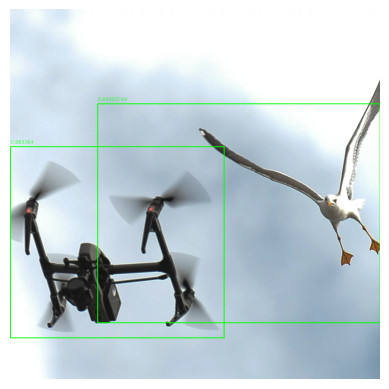

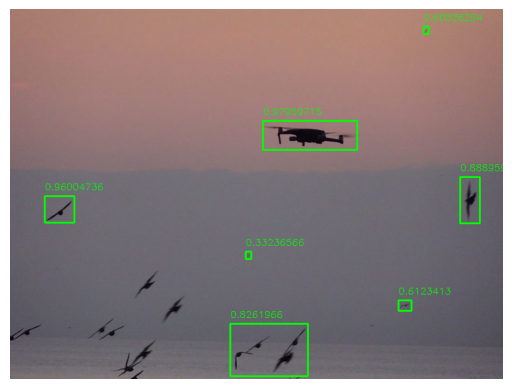

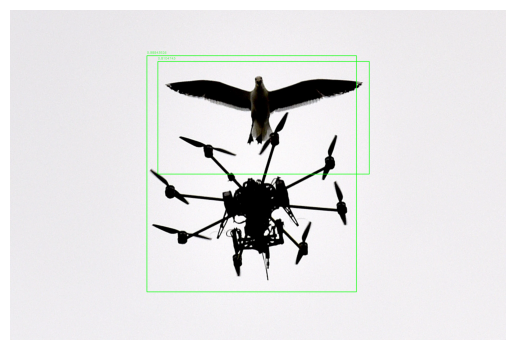

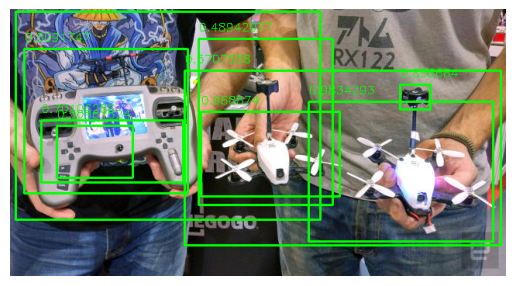

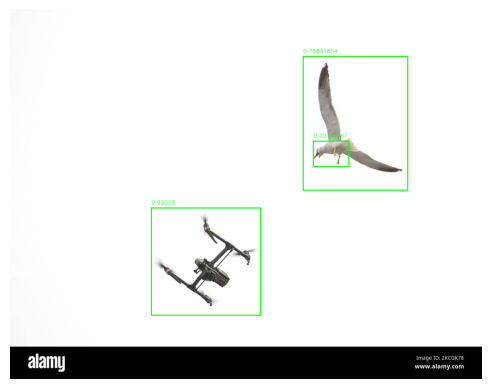

...

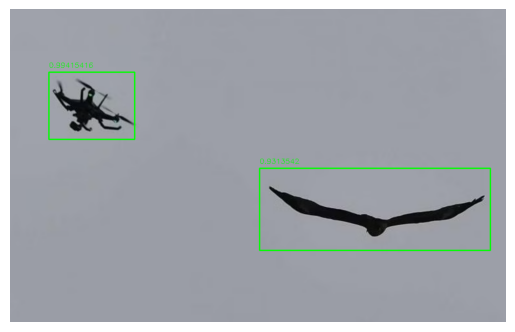

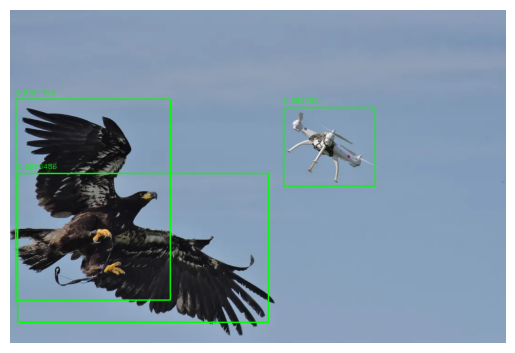

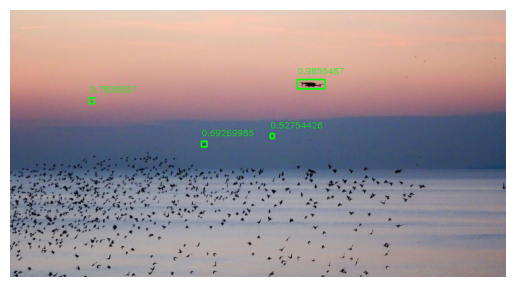

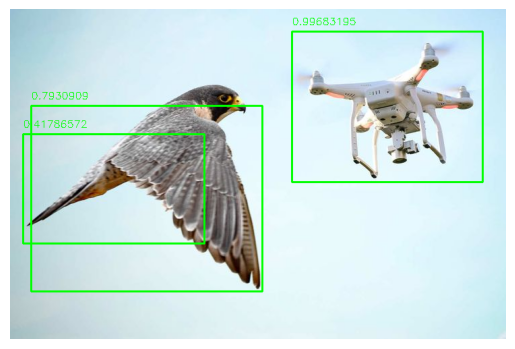

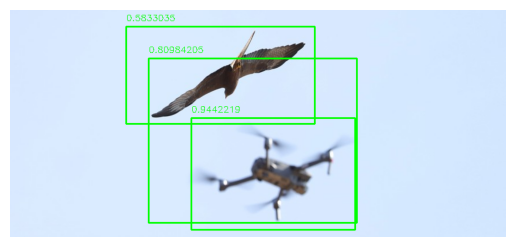

In [9]:
import time
import tqdm

### predict images

folder_path = '/kaggle/input/drone-detection-test-images-1'

# Get list of files in the folder
file_list = os.listdir(folder_path)

# Read each image in the folder
list_image = []
for file_name in file_list:
#     if file_name.endswith('.jpg') or file_name.endswith('.png'):
        image_path = os.path.join(folder_path, file_name)

        image = cv2.imread(image_path)
        if image is not None:
            list_image.append(image)

counter = 1
print(len(list_image))
for images in tqdm.tqdm(list_image):
    image = torch.tensor(images).to(device)
    image = image/255.0
    image = image.unsqueeze(0)
    image = image.permute(0,3,1,2)
    
    start = time.time()
    
    with torch.no_grad():
        outputs = model(image)
    print(len(outputs[0]))
    outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
    end = time.time()
    
    hours, rem = divmod(end-start, 3600)
    minutes, seconds = divmod(rem, 60)
    print('Number :',counter )
    print("Time taken to per image the model :{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

    boxes = outputs[0]['boxes'].cpu().detach().numpy().astype(np.int32)
    img = image.permute(0,2,3,1).cpu().detach().numpy()
    img = img.squeeze(0)
    labels= outputs[0]['labels'].cpu().detach().numpy().astype(np.int32)
    score = outputs[0]['scores'].cpu().detach().numpy()
    print('label:',labels ,'-  score:', score)
    

    fig, ax = plt.subplots(1, 1)#, figsize=(8, 5))
    font = cv2.FONT_HERSHEY_SIMPLEX
    img = cv2.cvtColor(np.float32(img), cv2.COLOR_RGB2BGR)
    for i in range(len(boxes)):
      if score[i]>0.20: 
        img = cv2.rectangle(img,(boxes[i][0]+paddingSize,boxes[i][1]+paddingSize),(boxes[i][2]+paddingSize,boxes[i][3]+paddingSize),(0,255,0),2)
        img = cv2.putText(img,str(score[i]),(boxes[i][0]+paddingSize,boxes[i][1]+paddingSize-10),font,0.5,(0,255,0),1)

    ax.set_axis_off()
    ax.imshow(img)
    fig.savefig(f'{counter}.jpeg',dpi = 600)
    
    counter = counter + 1